In [20]:
import numpy as np
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt

In [24]:
path = "/Users/eliasstrauss/PycharmProjects/Sentinel_Building_Segmentation/"

In [2]:
path = "/Users/eliasstrauss/PycharmProjects/Sentinel_Building_Segmentation/"
test_images = np.load('data/tensors/test_set_Berlin_sentinel.npy')
test_labels = np.load('data/tensors/test_set_Berlin_building.npy')
assert test_images.shape[:2] == test_labels.shape[:2]
share_of_buildings_test = np.sum(test_labels) / test_labels.size
share_of_buildings_test

np.float64(0.20788127778175391)

In [3]:
nr_samples = "_custom"
labels = np.load("data/tensors/building_segmentation_labels_dataset_equal_provenance{}.npy".format(nr_samples))
images = np.load("data/tensors/building_segmentation_images_dataset_equal_provenance{}.npy".format(nr_samples))
share_of_buildings = np.sum(labels) / labels.size
share_of_buildings, labels.shape[0]

(np.float64(0.20271414620535713), 1050)

In [4]:
images.shape, test_images.shape

((1050, 128, 128, 4), (1361, 1427, 4))

In [5]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)
print("train: {} vs. test: {}".format(np.sum(y_train) / y_train.size, np.sum(y_test) / y_test.size,))

tensor_x_train = torch.Tensor(X_train) # transform to torch tensor
tensor_y_train = torch.Tensor(y_train)
tensor_x_test = torch.Tensor(X_test)
tensor_y_test = torch.Tensor(y_test)

train: 0.20441196986607144 vs. test: 0.1959228515625


In [6]:
del images, labels, X_train, X_test, y_train, y_test
tensor_x_train.shape, tensor_y_train.shape, tensor_x_test.shape, tensor_y_test.shape

(torch.Size([840, 128, 128, 4]),
 torch.Size([840, 128, 128]),
 torch.Size([210, 128, 128, 4]),
 torch.Size([210, 128, 128]))

In [7]:
def eval_accuracy(predictions, truth):
    correct_total = (predictions == truth).sum().item() / (truth.size(0) * truth.size(1)*truth.size(2))
    correct_buildings = torch.logical_and((predictions == truth), truth).sum().item() / truth.sum().item()
    correct_land = torch.logical_and((predictions == truth), ~truth).sum().item() / (~truth).sum().item()
    errors = (predictions != truth)
    return errors, (correct_total, correct_buildings, correct_land)

In [21]:
def load_dataset(num_samples):
    labels_ = np.load(path + "data/tensors/building_segmentation_labels_dataset_equal_provenance{}.npy".format(num_samples))
    images_ = np.load(path + "data/tensors/building_segmentation_images_dataset_equal_provenance{}.npy".format(num_samples))
    X_train_, X_test_, y_train_, y_test_ = train_test_split(images_, labels_, test_size=0.2, random_state=42)
    del images_, labels_
    tensor_x_train_ = torch.Tensor(X_train_) # transform to torch tensor
    tensor_y_train_ = torch.Tensor(y_train_)
    tensor_x_test_ = torch.Tensor(X_test_)
    tensor_y_test_ = torch.Tensor(y_test_)
    del X_train_, X_test_, y_train_, y_test_
    train_dataset = TensorDataset(tensor_x_train_, tensor_y_train_)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    test_dataset = TensorDataset(tensor_x_test_, tensor_y_test_)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)
    return train_loader, test_loader

In [8]:
import torch.nn as nn
def get_model():
    C = 4
    model = nn.Sequential(
    nn.Conv2d(C, 32, kernel_size=3, padding=1), nn.ReLU(),
    nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.ReLU(),
    nn.Conv2d(64, 128, kernel_size=3, padding=1), nn.ReLU(),
    nn.Conv2d(128, 1, kernel_size=1, padding=0))
    criterion = nn.BCEWithLogitsLoss()
    return model, criterion

In [9]:
def train_model(model_to_train, loss_fn, optimizer, train_load):
    model_to_train.train()
    running_loss = 0.0

    for batch, batch_labels in train_load:
        optimizer.zero_grad()
        model_out = model_to_train(batch.permute(0, 3, 1, 2))  # Change shape to (batch_size, channels, height, width)
        batch_labels = batch_labels.unsqueeze(1).float()
        loss = loss_fn(model_out, batch_labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * batch.size(0)
    
    epoch_loss = running_loss / len(train_load.dataset)
    return epoch_loss

In [10]:
def test_model(model_to_test, test_load):
    accs = []
    with torch.no_grad():
        for batch, batch_labels in test_load:
            model_out = model_to_test(batch.permute(0, 3, 1, 2))  # Change shape to (batch_size, channels, height, width)
            predicted_labels = (model_out > 0).squeeze(1)
            _, acc = eval_accuracy(predicted_labels, batch_labels.to(torch.bool))
            accs.append(acc)
    return np.array(accs).mean(0)

In [26]:
import torch.optim as optim
from ray import train, tune


def objective(config):
    torch.manual_seed(2000)
    train_loader, test_loader = load_dataset("_custom")
    
    model, crit = get_model()
    optimizer = optim.Adam(model.parameters(), lr=config["lr"])
    while True:
        loss = train_model(model, crit, optimizer, train_loader)  # Train the model
        acc = test_model(model, test_loader)  # Compute test accuracy
        train.report({"mean_accuracy": acc[0]})  # Report to Tune

In [33]:
from ray.tune.search.optuna import OptunaSearch
search_space = {"lr": tune.loguniform(1e-4, 1e-2)}
algo = OptunaSearch()
trainable_with_resources = tune.with_resources(objective, {"cpu": 6})
tuner = tune.Tuner(
    trainable_with_resources,
    tune_config=tune.TuneConfig(
        num_samples=4,
        metric="mean_accuracy",
        mode="max",
        search_alg=algo,
    ),
    run_config=train.RunConfig(
        stop={"training_iteration": 3},
    ),
    param_space=search_space,
)
results = tuner.fit()
print("Best config is:", results.get_best_result().config)

2024-07-06 13:25:05,523	INFO tune.py:1041 -- Total run time: 706.39 seconds (706.38 seconds for the tuning loop).


Best config is: {'lr': 0.003016852862640127}


In [30]:
# build model
config = results.get_best_result().config

torch.manual_seed(2000)
train_loader, test_loader = load_dataset("_custom")

model, crit = get_model()
optimizer = optim.Adam(model.parameters(), lr=config["lr"])
for i in range(20):
    loss = train_model(model, crit, optimizer, train_loader)  # Train the model
    acc = test_model(model, test_loader)  # Compute test accuracy
    print("epoch {}: Loss = [{}], Accuracy = [{}]".format(i + 1, loss, acc))

epoch 1: Loss = [0.529975125903175], Accuracy = [[0.80192036 0.         1.        ]]
epoch 2: Loss = [0.4324329282556261], Accuracy = [[0.80291412 0.0019911  0.99970882]]
epoch 3: Loss = [0.4189363400141398], Accuracy = [[0.80751025 0.09133629 0.98232194]]
epoch 4: Loss = [0.4063813499041966], Accuracy = [[0.81587867 0.19413745 0.96737466]]
epoch 5: Loss = [0.3935949532758622], Accuracy = [[0.82237047 0.1701695  0.97783193]]
epoch 6: Loss = [0.38344545108931405], Accuracy = [[0.82527012 0.35991213 0.93908667]]
epoch 7: Loss = [0.3756673324675787], Accuracy = [[0.83048345 0.33210669 0.95203813]]
epoch 8: Loss = [0.3707632059142703], Accuracy = [[0.83295961 0.39351173 0.94077466]]
epoch 9: Loss = [0.36940559574535914], Accuracy = [[0.82710051 0.18285758 0.98353797]]
epoch 10: Loss = [0.3656399150689443], Accuracy = [[0.83500139 0.27508995 0.97068854]]
epoch 11: Loss = [0.3599078331674848], Accuracy = [[0.83504592 0.27965469 0.97091607]]
epoch 12: Loss = [0.3572576111271268], Accuracy = [

100: lr = 0.001, batch = 32 -> epoch 18
100: lr = 0.001, batch = 64 -> epoch 44
250: lr = 0.001, batch = 64 -> epoch 13 /25
custom lr = 0.001006, batch= 32 -> 20

In [31]:
model.eval()
with torch.no_grad():
        labels = torch.Tensor(test_labels).unsqueeze(0).to(torch.bool)
        test_input = torch.Tensor(test_images).unsqueeze(0)
        outputs = model(test_input.permute(0, 3, 1, 2))
        predicted = (outputs > 0).squeeze(0)
        print(predicted.shape, predicted.dtype)
        print(labels.shape, labels.dtype)

torch.Size([1, 1361, 1427]) torch.bool
torch.Size([1, 1361, 1427]) torch.bool


In [33]:
tensor_errors, accuracy = eval_accuracy(predicted, labels)
accuracy

(0.851664163423263, 0.42106723205262847, 0.9646687393680883)

best acc:
250, 64, lr=.001: (0.851664163423263, 0.42106723205262847, 0.9646687393680883)
0.8313119449763586 0.27671547744070385 0.9768585898046751

In [18]:
# prediction
predicted = predicted.squeeze(0).numpy()
print(predicted.shape)

(1361, 1427)


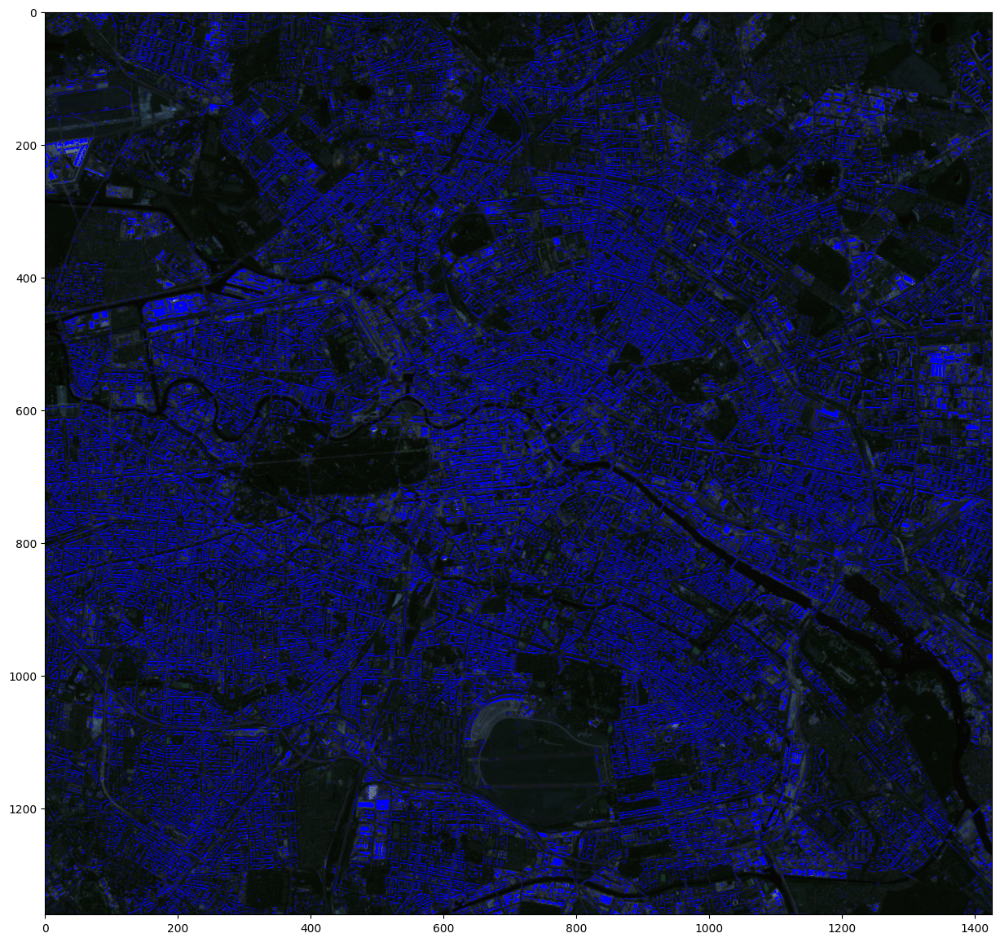

In [23]:
overlapped = test_images[:, :, :3].copy()
overlapped[predicted == 1] = [0, 0, 1]
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(overlapped)
fig.savefig("plots/test_set_prediction.pdf", bbox_inches='tight', dpi=200)

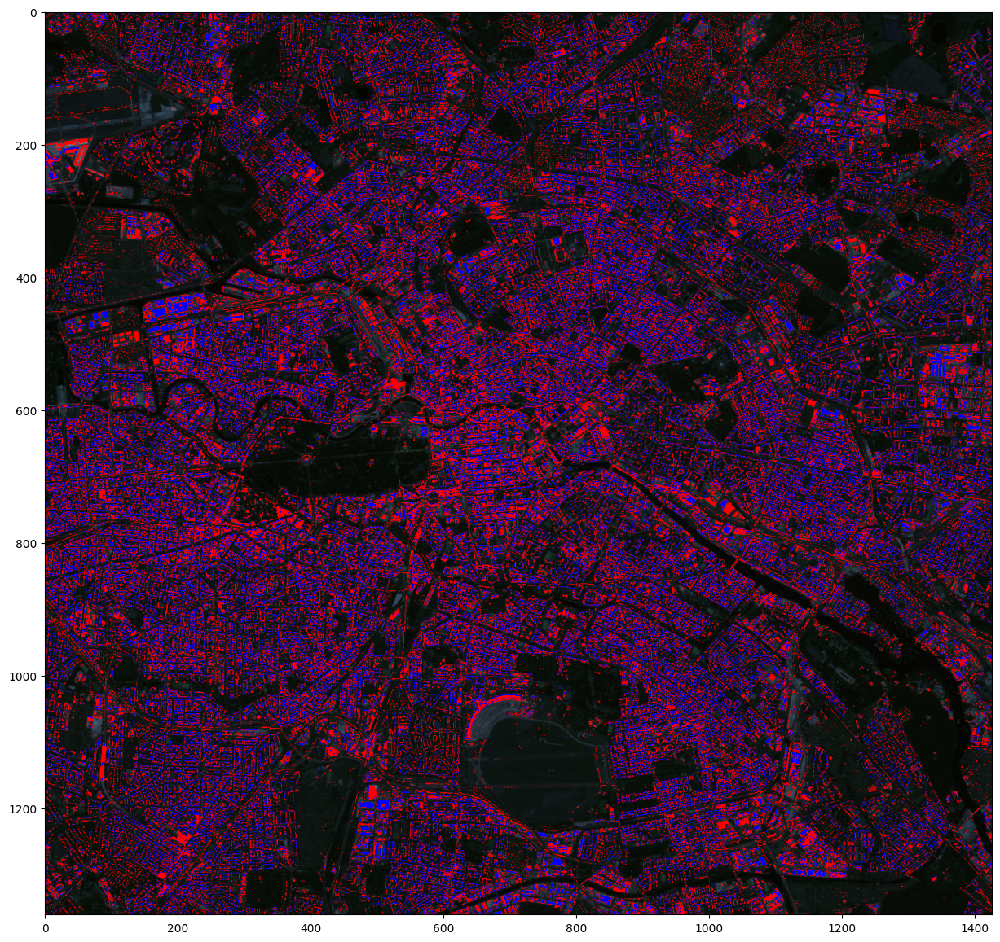

In [25]:
overlapped[tensor_errors.squeeze(0) == 1] = [1, 0, 0]
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(overlapped)
fig.savefig("plots/test_set_error.pdf", bbox_inches='tight', dpi=200)

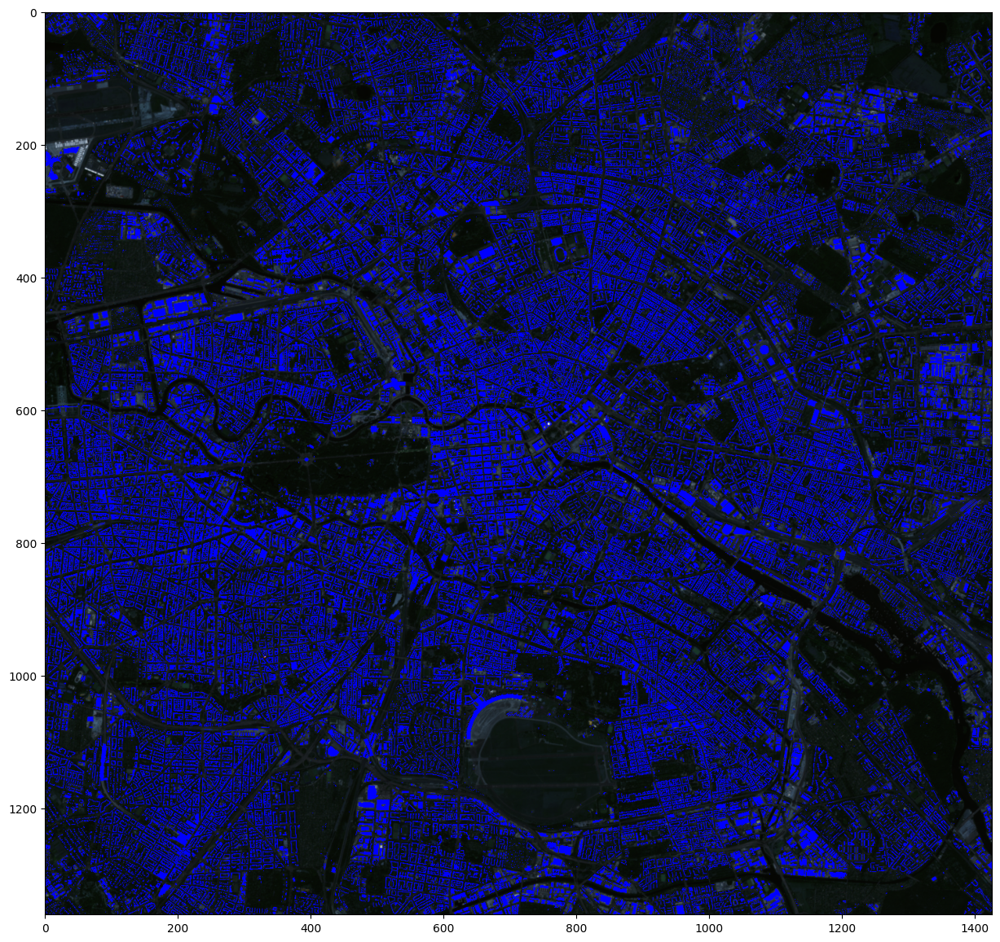

In [26]:
# ground truth
overlapped = test_images[:, :, :3].copy()
overlapped[test_labels == 1] = [0, 0, 1]
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(overlapped)
fig.savefig("plots/test_set_ground_truth.pdf", bbox_inches='tight', dpi=200)